# **INTRODUCCION**

**Práctica Clasificación de Objetos Usando Técnicas de Deep Learning – Parte 1A**

Segmentación de personas usando YOLOv11 (Transfer Learning)

En esta práctica se desarrolla un sistema de **segmentación de personas** empleando técnicas de *Deep Learning* mediante **transfer learning** sobre un modelo YOLOv11-seg.  

Se utiliza un **subconjunto propio del dataset COCO**, filtrado únicamente para la clase *person*, con el fin de entrenar y validar el modelo.  
El entrenamiento y las pruebas se realizan en **Google Colab**, haciendo uso de **GPU**, y posteriormente se evaluará el desempeño del modelo mediante inferencia sobre imágenes y video.

El objetivo principal es:
- Preparar un dataset personalizado
- Entrenar una red YOLO para segmentación
- Verificar el funcionamiento del modelo entrenado
- Analizar el uso de GPU frente a CPU


# **CONFIGURACION DEL ENTORNO**

In [ ]:
# Instalación de dependencias
%pip install -q ultralytics supervision onnx

# Importaciones base
import os
import json
import random
import cv2
import time
import numpy as np

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.2/1.2 MB 23.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 212.4/212.4 kB 11.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 18.1/18.1 MB 37.1 MB/s eta 0:00:00


In [ ]:
import ultralytics
ultralytics.checks()

Ultralytics 8.3.249 🚀 Python-3.12.12 torch-2.9.0+cu126 CUDA:0 (Tesla T4, 15095MiB)
Setup complete ✅ (2 CPUs, 12.7 GB RAM, 38.6/112.6 GB disk)


# **DESCARGAR Y PREPARACION DEL DATASET**

Se utiliza el dataset **COCO 2017**, del cual se extrae únicamente la clase *person*.  
Para esta práctica se seleccionan aleatoriamente:
- 300 imágenes para entrenamiento
- 50 imágenes para validación

Esto permite trabajar con un dataset propio y reducido, evitando el uso completo del conjunto original.


In [ ]:
import requests
from tqdm import tqdm

# ================= CONFIG =================
JSON_PATH = "/content/instances_train2017.json"
OUTPUT_DIR = "/content/dataset/images/train"
MAX_IMAGES = 300
COCO_BASE_URL = "http://images.cocodataset.org/train2017/"
# =========================================

os.makedirs(OUTPUT_DIR, exist_ok=True)

with open(JSON_PATH, "r") as f:
    coco = json.load(f)

# Obtener ID de la categoría "person"
person_category_id = next(
    cat["id"] for cat in coco["categories"] if cat["name"] == "person"
)

# IDs de imágenes con personas
image_ids = {
    ann["image_id"]
    for ann in coco["annotations"]
    if ann["category_id"] == person_category_id
}

image_ids = list(image_ids)
random.shuffle(image_ids)
image_ids = image_ids[:MAX_IMAGES]

# Mapear ID → filename
id_to_filename = {
    img["id"]: img["file_name"]
    for img in coco["images"]
    if img["id"] in image_ids
}

# Descargar imágenes
for _, filename in tqdm(id_to_filename.items(), desc="Descargando imágenes"):
    url = COCO_BASE_URL + filename
    out_path = os.path.join(OUTPUT_DIR, filename)

    if os.path.exists(out_path):
        continue

    r = requests.get(url, stream=True)
    if r.status_code == 200:
        with open(out_path, "wb") as f:
            for chunk in r.iter_content(1024):
                f.write(chunk)

Descargando imágenes: 100%|██████████| 300/300 [02:11<00:00,  2.29it/s]


# **CONVERSION COCO -> YOLO-seg**

Las anotaciones originales del dataset COCO se encuentran en formato JSON.  
Para poder entrenar el modelo YOLOv11-seg, estas anotaciones se convierten al formato **YOLO Segmentación**, donde cada archivo `.txt` contiene los vértices normalizados del polígono de la máscara.


In [ ]:
# ================= CONFIG =================
JSON_PATH = "/content/instances_train2017.json"
IMAGES_DIR = "/content/dataset/images/train"
LABELS_DIR = "/content/dataset/labels/train"
CLASS_ID = 0  # person
# =========================================

os.makedirs(LABELS_DIR, exist_ok=True)

with open(JSON_PATH, "r") as f:
    coco = json.load(f)

person_id = next(cat["id"] for cat in coco["categories"] if cat["name"] == "person")

images_info = {img["id"]: img for img in coco["images"]}

annotations_per_image = {}
for ann in coco["annotations"]:
    if ann["category_id"] == person_id:
        annotations_per_image.setdefault(ann["image_id"], []).append(ann)

for image_id, anns in annotations_per_image.items():
    img = images_info[image_id]
    filename = img["file_name"]
    img_path = os.path.join(IMAGES_DIR, filename)

    if not os.path.exists(img_path):
        continue

    w, h = img["width"], img["height"]
    label_path = os.path.join(LABELS_DIR, filename.replace(".jpg", ".txt"))

    with open(label_path, "w") as f:
        for ann in anns:
            if isinstance(ann["segmentation"], list):
                for seg in ann["segmentation"]:
                    if len(seg) < 6:
                        continue

                    norm = []
                    for i in range(0, len(seg), 2):
                        norm.append(seg[i] / w)
                        norm.append(seg[i + 1] / h)

                    line = str(CLASS_ID) + " " + " ".join(f"{x:.6f}" for x in norm)
                    f.write(line + "\n")

# **ESTRUCTURA FINAL DEL DATASET**

El archivo `dataset.yaml` define la estructura del conjunto de datos y las clases utilizadas.

In [ ]:
%%writefile /content/dataset/dataset.yaml
path: /content/dataset
train: images/train
val: images/val

names:
  0: person


Writing /content/dataset/dataset.yaml


In [ ]:
!ls /content/dataset
!ls /content/dataset/images
!ls /content/dataset/labels

dataset.yaml  images  labels
train  val
train  val


# **ENTRENAMIENTO YOLO(TRANSFER LEARNING)**

Se emplea un modelo YOLOv11 preentrenado para segmentación (`yolo11n-seg.pt`) y se ajusta mediante *transfer learning* utilizando el dataset personalizado de personas.

In [12]:
from ultralytics import YOLO

model = YOLO("yolo11n-seg.pt")

model.train(
    data="/content/dataset/dataset.yaml",
    epochs=50,
    imgsz=640,
    batch=8,
    device=0
)

Ultralytics 8.3.249 🚀 Python-3.12.12 torch-2.9.0+cu126 CUDA:0 (Tesla T4, 15095MiB)
engine/trainer: agnostic_nms=False, amp=True, augment=False, auto_augment=randaugment, batch=8, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, compile=False, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/content/dataset/dataset.yaml, degrees=0.0, deterministic=True, device=0, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=50, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=yolo11n-seg.pt, momentum=0.937, mosaic=1.0, multi_scale=False, name=train, nbs=64, nms=False, opset=None, optimize=False, optimizer=auto, overlap_mask=True, patience=100, perspective=0.0, plots=True, pose=

ultralytics.utils.metrics.SegmentMetrics object with attributes:

ap_class_index: array([0])
box: ultralytics.utils.metrics.Metric object
confusion_matrix: <ultralytics.utils.metrics.ConfusionMatrix object at 0x7a7d092989e0>
curves: ['Precision-Recall(B)', 'F1-Confidence(B)', 'Precision-Confidence(B)', 'Recall-Confidence(B)', 'Precision-Recall(M)', 'F1-Confidence(M)', 'Precision-Confidence(M)', 'Recall-Confidence(M)']
curves_results: [[array([          0,    0.001001,    0.002002,    0.003003,    0.004004,    0.005005,    0.006006,    0.007007,    0.008008,    0.009009,     0.01001,    0.011011,    0.012012,    0.013013,    0.014014,    0.015015,    0.016016,    0.017017,    0.018018,    0.019019,     0.02002,    0.021021,    0.022022,    0.023023,
          0.024024,    0.025025,    0.026026,    0.027027,    0.028028,    0.029029,     0.03003,    0.031031,    0.032032,    0.033033,    0.034034,    0.035035,    0.036036,    0.037037,    0.038038,    0.039039,     0.04004,    0.041041, 

# **INFERENCIA CON EL MODELO ENTRENADO**

**8.1 Cargar el mejor modelo entrenado**

In [13]:
# Cargar el modelo entrenado
model = YOLO("/content/runs/segment/train/weights/best.pt")

**8.2 Inferencia sobre imágenes (GPU)**

Se realiza la inferencia utilizando el modelo entrenado sobre imágenes de validación, ejecutando el proceso en GPU.


In [14]:
results = model.predict(
    source="/content/dataset/images/val",
    device=0,        # GPU
    conf=0.5,
    save=True
)


image 1/50 /content/dataset/images/val/000000005193.jpg: 448x640 6 persons, 140.1ms
image 2/50 /content/dataset/images/val/000000008211.jpg: 480x640 2 persons, 134.3ms
image 3/50 /content/dataset/images/val/000000011511.jpg: 480x640 2 persons, 29.8ms
image 4/50 /content/dataset/images/val/000000014226.jpg: 480x640 1 person, 22.2ms
image 5/50 /content/dataset/images/val/000000035062.jpg: 640x448 (no detections), 132.5ms
image 6/50 /content/dataset/images/val/000000067180.jpg: 640x480 1 person, 129.3ms
image 7/50 /content/dataset/images/val/000000080153.jpg: 640x448 1 person, 30.2ms
image 8/50 /content/dataset/images/val/000000086220.jpg: 448x640 (no detections), 18.0ms
image 9/50 /content/dataset/images/val/000000107851.jpg: 480x640 2 persons, 19.3ms
image 10/50 /content/dataset/images/val/000000109992.jpg: 448x640 1 person, 18.2ms
image 11/50 /content/dataset/images/val/000000117525.jpg: 640x640 (no detections), 17.1ms
image 12/50 /content/dataset/images/val/000000118405.jpg: 480x640 

**8.3 Visualización de resultados**

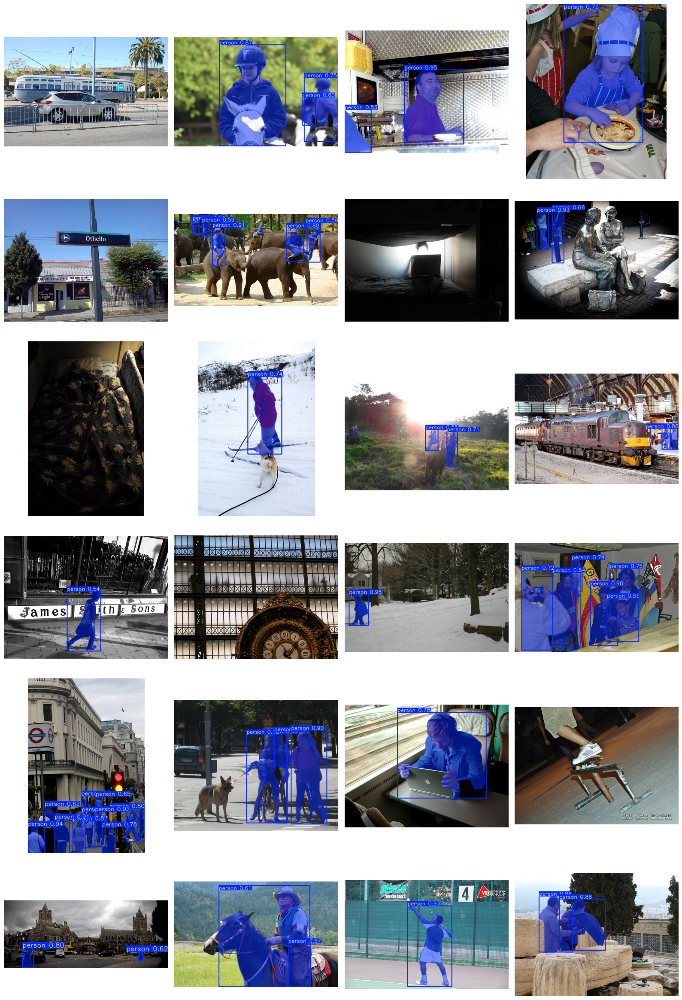

In [20]:
import matplotlib.pyplot as plt
import math
import random

pred_dir = "runs/segment/predict"

# Configuración
N_IMAGES = 24      # número de imágenes a mostrar
N_COLS = 4         # columnas de la grilla
RANDOM_SEED = 42   # fija el azar (opcional, para reproducibilidad)

random.seed(RANDOM_SEED)

# Obtener archivos válidos
files = [
    f for f in os.listdir(pred_dir)
    if f.lower().endswith((".jpg", ".png"))
]

# Selección aleatoria
files = random.sample(files, min(N_IMAGES, len(files)))

# Calcular filas
N_ROWS = math.ceil(len(files) / N_COLS)

plt.figure(figsize=(4 * N_COLS, 4 * N_ROWS))

for idx, filename in enumerate(files):
    img_path = os.path.join(pred_dir, filename)
    img = cv2.imread(img_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

    plt.subplot(N_ROWS, N_COLS, idx + 1)
    plt.imshow(img)
    plt.axis("off")

plt.tight_layout()
plt.show()


## **Inferencia sobre video (GPU)**

**9.1 Subir un video corto**

In [21]:
from google.colab import files
files.upload()

Saving video1.mp4 to video1 (1).mp4


{'video1 (1).mp4': b'\x00\x00\x00\x18ftypmp42\x00\x00\x00\x00isommp42\x00\x00$~moov\x00\x00\x00lmvhd\x00\x00\x00\x00\xe0\xa1\xdaT\xe0\xa1\xdaT\x00\x00u0\x00\tx}\x00\x01\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00@\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x03\x00\x00\x12\xeftrak\x00\x00\x00\\tkhd\x00\x00\x00\x03\xe0\xa1\xdaT\xe0\xa1\xdaT\x00\x00\x00\x01\x00\x00\x00\x00\x00\txL\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00@\x00\x00\x00\x02\x80\x00\x00\x01h\x00\x00\x00\x00\x00$edts\x00\x00\x00\x1celst\x00\x00\x00\x00\x00\x00\x00\x01\x00\txL\x00\x00\x03\xe9\x00\x01\x00\x00\x00\x00\x12gmdia\x00\x00\x00 mdhd\x00\x00\x00\x00\xe0\xa1\x

**9.2 Inferencia sobre video (GPU)**

Se evalúa el modelo entrenado sobre un video, ejecutando la inferencia en GPU y observando el comportamiento en tiempo real.


In [22]:
model.predict(
    source="video1.mp4",   # nombre del video subido
    device=0,
    conf=0.5,
    save=True
)


WARNING ⚠️ 
Inference results will accumulate in RAM unless `stream=True` is passed, which can cause out-of-memory errors for large
sources or long-running streams and videos. See https://docs.ultralytics.com/modes/predict/ for help.

Example:
    results = model(source=..., stream=True)  # generator of Results objects
    for r in results:
        boxes = r.boxes  # Boxes object for bbox outputs
        masks = r.masks  # Masks object for segment masks outputs
        probs = r.probs  # Class probabilities for classification outputs

video 1/1 (frame 1/620) /content/video1.mp4: 384x640 4 persons, 32.7ms
video 1/1 (frame 2/620) /content/video1.mp4: 384x640 4 persons, 25.5ms
video 1/1 (frame 3/620) /content/video1.mp4: 384x640 5 persons, 25.3ms
video 1/1 (frame 4/620) /content/video1.mp4: 384x640 5 persons, 27.1ms
video 1/1 (frame 5/620) /content/video1.mp4: 384x640 4 persons, 25.5ms
video 1/1 (frame 6/620) /content/video1.mp4: 384x640 4 persons, 24.8ms
video 1/1 (frame 7/620) /content

[ultralytics.engine.results.Results object with attributes:
 
 boxes: ultralytics.engine.results.Boxes object
 keypoints: None
 masks: ultralytics.engine.results.Masks object
 names: {0: 'person'}
 obb: None
 orig_img: array([[[ 24,  27,  27],
         [ 22,  25,  25],
         [ 19,  22,  22],
         ...,
         [200, 195, 187],
         [200, 195, 187],
         [200, 195, 187]],
 
        [[ 28,  31,  31],
         [ 27,  30,  30],
         [ 26,  29,  29],
         ...,
         [200, 195, 187],
         [200, 195, 187],
         [200, 195, 187]],
 
        [[ 24,  27,  27],
         [ 28,  31,  31],
         [ 34,  37,  37],
         ...,
         [200, 195, 187],
         [200, 195, 187],
         [200, 195, 187]],
 
        ...,
 
        [[107,  93, 100],
         [107,  93, 100],
         [105,  91,  98],
         ...,
         [174, 166, 154],
         [175, 165, 151],
         [175, 165, 151]],
 
        [[107, 116, 122],
         [107, 116, 122],
         [105, 114, 120

## **Evidencia de detección en video**

En el siguiente video se observa la segmentación de personas realizada por el modelo YOLOv11-seg entrenado, donde se identifican correctamente los individuos a lo largo de la secuencia.


In [29]:
!ffmpeg -y -i runs/segment/predict/video1.avi \
        -vcodec libx264 -pix_fmt yuv420p \
        runs/segment/predict/video1.mp4


ffmpeg version 4.4.2-0ubuntu0.22.04.1 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11 (Ubuntu 11.2.0-19ubuntu1)
  configuration: --prefix=/usr --extra-version=0ubuntu0.22.04.1 --toolchain=hardened --libdir=/usr/lib/x86_64-linux-gnu --incdir=/usr/include/x86_64-linux-gnu --arch=amd64 --enable-gpl --disable-stripping --enable-gnutls --enable-ladspa --enable-libaom --enable-libass --enable-libbluray --enable-libbs2b --enable-libcaca --enable-libcdio --enable-libcodec2 --enable-libdav1d --enable-libflite --enable-libfontconfig --enable-libfreetype --enable-libfribidi --enable-libgme --enable-libgsm --enable-libjack --enable-libmp3lame --enable-libmysofa --enable-libopenjpeg --enable-libopenmpt --enable-libopus --enable-libpulse --enable-librabbitmq --enable-librubberband --enable-libshine --enable-libsnappy --enable-libsoxr --enable-libspeex --enable-libsrt --enable-libssh --enable-libtheora --enable-libtwolame --enable-libvidstab --enable-libvorbis --enable-libvpx --enab

In [30]:
from IPython.display import Video, display

display(Video("runs/segment/predict/video1.mp4", embed=True))


# **COMPARACION CPU VS GPU**

**10.1 Inferencia en GPU (medición FPS)**

In [23]:
start = time.time()

model.predict(
    source="video1.mp4",
    device=0,
    conf=0.5,
    save=False
)

gpu_time = time.time() - start
print(f"Tiempo total en GPU: {gpu_time:.2f} s")


WARNING ⚠️ 
Inference results will accumulate in RAM unless `stream=True` is passed, which can cause out-of-memory errors for large
sources or long-running streams and videos. See https://docs.ultralytics.com/modes/predict/ for help.

Example:
    results = model(source=..., stream=True)  # generator of Results objects
    for r in results:
        boxes = r.boxes  # Boxes object for bbox outputs
        masks = r.masks  # Masks object for segment masks outputs
        probs = r.probs  # Class probabilities for classification outputs

video 1/1 (frame 1/620) /content/video1.mp4: 384x640 4 persons, 24.5ms
video 1/1 (frame 2/620) /content/video1.mp4: 384x640 4 persons, 24.7ms
video 1/1 (frame 3/620) /content/video1.mp4: 384x640 5 persons, 27.5ms
video 1/1 (frame 4/620) /content/video1.mp4: 384x640 5 persons, 23.2ms
video 1/1 (frame 5/620) /content/video1.mp4: 384x640 4 persons, 22.9ms
video 1/1 (frame 6/620) /content/video1.mp4: 384x640 4 persons, 23.9ms
video 1/1 (frame 7/620) /content

**10.2 Inferencia en CPU (medición FPS)**

In [24]:
start = time.time()

model.predict(
    source="video1.mp4",
    device="cpu",
    conf=0.5,
    save=False
)

cpu_time = time.time() - start
print(f"Tiempo total en CPU: {cpu_time:.2f} s")


WARNING ⚠️ 
Inference results will accumulate in RAM unless `stream=True` is passed, which can cause out-of-memory errors for large
sources or long-running streams and videos. See https://docs.ultralytics.com/modes/predict/ for help.

Example:
    results = model(source=..., stream=True)  # generator of Results objects
    for r in results:
        boxes = r.boxes  # Boxes object for bbox outputs
        masks = r.masks  # Masks object for segment masks outputs
        probs = r.probs  # Class probabilities for classification outputs

video 1/1 (frame 1/620) /content/video1.mp4: 384x640 4 persons, 1694.6ms
video 1/1 (frame 2/620) /content/video1.mp4: 384x640 4 persons, 1099.3ms
video 1/1 (frame 3/620) /content/video1.mp4: 384x640 5 persons, 958.9ms
video 1/1 (frame 4/620) /content/video1.mp4: 384x640 5 persons, 891.5ms
video 1/1 (frame 5/620) /content/video1.mp4: 384x640 4 persons, 944.2ms
video 1/1 (frame 6/620) /content/video1.mp4: 384x640 4 persons, 895.0ms
video 1/1 (frame 7/620) 

# **USO DE GPU**

In [26]:
!nvidia-smi

Thu Jan  8 03:34:13 2026       
+-----------------------------------------------------------------------------------------+
| NVIDIA-SMI 550.54.15              Driver Version: 550.54.15      CUDA Version: 12.4     |
|-----------------------------------------+------------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id          Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |           Memory-Usage | GPU-Util  Compute M. |
|                                         |                        |               MIG M. |
|=========================================+========================+======================|
|   0  Tesla T4                       Off |   00000000:00:04.0 Off |                    0 |
| N/A   70C    P0             32W /   70W |    2928MiB /  15360MiB |      0%      Default |
|                                         |                        |                  N/A |
+-----------------------------------------+-----

# **CONCLUSIONES**

La preparación del dataset a partir de COCO permitió entender la importancia de seleccionar y organizar correctamente los datos, ya que fue necesario filtrar únicamente la clase person, separar manualmente los conjuntos de entrenamiento y validación, y convertir las anotaciones al formato compatible con YOLO para segmentación.

El uso de un modelo preentrenado YOLOv11-seg facilitó el entrenamiento con un número limitado de imágenes, evidenciando que el transfer learning es una estrategia efectiva cuando no se dispone de grandes volúmenes de datos propios.

Durante las pruebas de inferencia se comprobó que la ejecución en GPU reduce de forma notable el tiempo de procesamiento en comparación con la CPU, lo que resulta clave para aplicaciones que trabajan con video o requieren procesamiento en tiempo casi real.

El desarrollo completo del flujo de trabajo, desde la preparación del dataset hasta la inferencia sobre imágenes y video, permitió consolidar los conocimientos sobre el funcionamiento de modelos YOLO para segmentación y comprender mejor los factores que influyen en su desempeño y uso en escenarios prácticos.